In [3]:
%pylab inline
import gc
import os
import pandas
import detect3D
import astropy.io.fits as pyfits
from astropy.table import Table,join,vstack
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display')

import maputil as mapUtil
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew

pDict={'dempz': 'demp',\
       'dnnz': 'dnn',\
       'mizuki': 'mizuki'}
nsim=200
key='dempz'
colname=pDict[key]
glab='test'
fieldname='XMM'
pzDir=os.path.join('datDir/catalog_tracts/','%s_tracts/' %fieldname)
configName  =   'wrkDir/config-nl15.ini'
parser      =   ConfigParser()
parser.read(configName)
catDir=   'wrkDir/test/'
outDir=   'wrkDir/test/'
mockDir=  'wrkDir/test/mock/'
if not os.path.isdir(mockDir):
    os.mkdir(mockDir)
    
fnameT=os.path.join(catDir,'%s.fits' %fieldname)
fname=os.path.join(catDir,'src.fits')
g1fname=os.path.join(outDir,'g1Map-%s.fits' %(key))
g2fname=os.path.join(outDir,'g2Map-%s.fits' %(key))
lenskerfname=os.path.join(outDir,'lensker-%s-10bins.fits' %key)
stdfname=os.path.join(outDir,'stdMap-%s.fits' %(key))

Populating the interactive namespace from numpy and matplotlib


/home/xiangchong/work/ana/lsstsw/miniconda/envs/lsst-scipipe-cb4e2dc/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['vstack']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


# prepare Catalog
## main catalog

In [ ]:
if False:
    data=pyfits.getdata(fnameT)
    raMin=31.5;raMax=33.5
    decMin=-5;decMax=-3.
    mask=(data['ra']>raMin)&(data['ra']<raMax)
    mask&=(data['dec']>decMin)&(data['dec']<decMax)
    data=data[mask]
    pyfits.writeto(fname,data,overwrite=True)
    
if True:
    data=Table.read(fname)
    ids=data['Id',]
    ids.rename_column('Id','ID')
    tracts=list(set(data['tract']))
    print(tracts)
    pzAll=[]
    for tract in tracts:
        pfname=os.path.join(pzDir,'%s_pz_pdf_%s.fits' %(tract,key))
        pzs=Table.read(pfname)
        pzAll.append(join(left=ids,right=pzs,keys='ID',join_type='inner'))
        del pzs,pfname
        gc.collect()
    pzAll=vstack(pzAll)
    pzAll.sort('ID')
    assert np.all(data['Id']==pzAll['ID'])
    del ids,tracts,data
    gn=fname.split('-')[-1].split('.')[0]
    ofname=os.path.join(catDir,'poz-%s.fits' %(key))
    pzAll.write(ofname)
    del pzAll
    gc.collect()

## mock catalogs

In [2]:
nobj=len(cat)
for i in range(nsim):
    catMock   =   cat.copy()
    np.random.seed(i)
    phi = 2.0 * np.pi * np.random.rand(nobj)
    g1n,g2n   =   mapUtil.rotCatalog(cat['g1'],cat['g2'],phi)
    catMock['g1']=g1n
    catMock['g2']=g2n
    pyfits.writeto(os.path.join(matDir,'src-%d.fits' %i),catMock,overwrite=True)
    del catMock
    gc.collect()

NameError: name 'cat' is not defined

# poz and lensing kernel

In [2]:
nz=10
pzDir=os.path.join('datDir/catalog_tracts/','XMM_tracts/')
pbins= pyfits.getdata(os.path.join(pzDir,'8522_pz_pdf_%s.fits' %key),ext=2)['BINS']
nbin=len(pbins)

data=pyfits.getdata(fname)
# poz average
mask=(~np.isnan(data['%s_zbest' %colname]))\
    &(data['%s_zbest_std'%colname]<1.0)\
    &(data['%s_zbest'%colname]<3.0)\
    &(data['%s_zbest'%colname]>0.05)
poz_best=data['%s_zbest'%colname]
poz_best=poz_best[mask]
bounds=np.percentile(poz_best,np.linspace(0,100,nz+1))

pfname=os.path.join(catDir,'poz-%s.fits' %key)
pata=pyfits.getdata(pfname)
pata=pata[mask]
poz_ave=np.zeros((nz,nbin))
for iz in range(nz):
    tmp_msk=(poz_best>=bounds[iz])&(poz_best<bounds[iz+1])
    poz_ave[iz]=np.average(pata['PDF'][tmp_msk],axis=0)
out=pyfits.HDUList([pyfits.PrimaryHDU(poz_ave),\
pyfits.BinTableHDU.from_columns([pyfits.Column(name='zbounds',array=bounds,format='D')])])
outname1=os.path.join(outDir,'poz-%s-10bins.fits' %(key))
out.writeto(outname1,overwrite=True)
del data,pata,out
gc.collect()
outname2=os.path.join(outDir,'pozave-%s-10bins.png' %(key))
mapUtil.plotPozAve(glab,pbins,poz_ave,outname2)

In [3]:
# configuration
parser      =   ConfigParser()
parser.read(configName)
parser.set('sourceZ','zbound','[%s]' %(','.join([str(bb) for bb in bounds])))
gridInfo    =   cartesianGrid3D(parser)

In [5]:
# lensing kernel
lensKer1= gridInfo.lensing_kernel()
lensKer2= gridInfo.lensing_kernel(poz_grids=pbins,poz_ave=poz_ave)
out=pyfits.HDUList([pyfits.PrimaryHDU(lensKer2),pyfits.ImageHDU(lensKer1)])
out.writeto(lenskerfname,overwrite=True)
pltname=os.path.join(outDir,'lensker-%s-10bins.png' %key)
mapUtil.plotLensKernel(glab,gridInfo.zcgrid,lensKer1,lensKer2,pltname)

# Pixelization
## main catalog

In [4]:
# poz average
data=pyfits.getdata(fname)
mask=(~np.isnan(data['%s_zbest' %colname]))\
    &(data['%s_zbest_std'%colname]<1.0)\
    &(data['%s_zbest'%colname]<3.0)\
    &(data['%s_zbest'%colname]>0.05)
data=data[mask]
wsAve=np.average(data['weight'])
ws=data['weight']/wsAve
z=data['%s_zbest'%colname]
x,y=gridInfo.setupTanPlane(data['ra'],data['dec'])
out1=gridInfo.pixelize_data(x,y,z,data['g1'],ws=ws)
out2=gridInfo.pixelize_data(x,y,z,data['g2'],ws=ws)
pyfits.writeto(g1fname,out1,overwrite=True)
pyfits.writeto(g2fname,out2,overwrite=True)
outname3=os.path.join(outDir,'g1Hist-%s.png' %(key))
mapUtil.plotHist(glab,data['g1'],out1[out1!=0],outname3)
del out1,out2,data,bounds,x,y,z,ws
gc.collect()

12221

## mock catalogs

In [5]:
data=pyfits.getdata(fname)
mask=(~np.isnan(data['%s_zbest' %colname]))\
    &(data['%s_zbest_std'%colname]<1.0)\
    &(data['%s_zbest'%colname]<3.0)\
    &(data['%s_zbest'%colname]>0.05)
data=data[mask]
wsAve=np.average(data['weight'])
ws=data['weight']/wsAve
z=data['%s_zbest'%colname]
x,y=gridInfo.setupTanPlane(data['ra'],data['dec'])
del data
gc.collect()
gStd=np.zeros(gridInfo.shape)
for i in range(nsim):
    fname2=os.path.join(mockDir,'src-%s.fits' %i)
    data=pyfits.getdata(fname2)[mask]
    out1=gridInfo.pixelize_data(x,y,z,data['g1'],ws=ws)
    out2=gridInfo.pixelize_data(x,y,z,data['g2'],ws=ws)
    outname1=os.path.join(mockDir,'g1Map-%s-%s.fits' %(key,i))
    outname2=os.path.join(mockDir,'g2Map-%s-%s.fits' %(key,i))
    pyfits.writeto(outname1,out1,overwrite=True)
    pyfits.writeto(outname2,out2,overwrite=True)
    gStd+=(out1)**2.
    gStd+=(out2)**2.
    del out1,out2,data,fname2
    gc.collect() 
gStd/=nsim
gStd=np.sqrt(gStd)
pyfits.writeto(stdfname,gStd,overwrite=True)

# reconstruction
## prepare

In [5]:
assert os.path.isfile(g1fname)
assert os.path.isfile(g2fname)
assert os.path.isfile(stdfname)
assert os.path.isfile(lenskerfname)
# configuration
parser.set('prepare','g1fname',g1fname)
parser.set('prepare','g2fname',g2fname)
parser.set('prepare','sigmafname',stdfname)
parser.set('prepare','lkfname',lenskerfname)

parser.set('lensZ','resolve_lim','.5')
parser.set('lensZ','rs_base','.12')
#parser.set('lensZ','rs_base','0.')    #Mpc/h

# Reconstruction Init
tau=0.
lbd=5.
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','3' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
parser.set('sparse','mu','4e-4')
a=pyfits.getdata(stdfname)
nz,ny,nx=a.shape
parser.set('transPlane','ny','%d' %ny)
parser.set('transPlane','nx','%d' %nx)
sparse3D    =   massmapSparsityTaskNew(parser)

with open(os.path.join(catDir,'config.ini'),'w') as configfile:
    parser.write(configfile)

In [4]:
sparse3D.dict2D.rs_frame

array([[ 3.47318945,  6.9463789 , 10.41956835],
       [ 1.75366704,  3.50733408,  5.26100113],
       [ 1.18084033,  2.36168067,  3.542521  ],
       [ 0.89467724,  1.78935447,  2.68403171],
       [ 0.7231711 ,  1.44634219,  2.16951329],
       [ 0.60898625,  1.2179725 ,  1.82695875],
       [ 0.52755024,  1.05510048,  1.58265072],
       [ 0.        ,  0.93315371,  1.39973056],
       [ 0.        ,  0.83848095,  1.25772143],
       [ 0.        ,  0.76289162,  1.14433743],
       [ 0.        ,  0.70117371,  1.05176057],
       [ 0.        ,  0.64985276,  0.97477914],
       [ 0.        ,  0.60652356,  0.90978534],
       [ 0.        ,  0.56946834,  0.85420251],
       [ 0.        ,  0.53742759,  0.80614138]])

## lasso

In [5]:
sparse3D.process(1500)

In [6]:
sigmaA=sparse3D.sigmaA
msk=sigmaA>10.
sigmaA[msk]=0.
pyfits.writeto('aaa1.fits',sigmaA,overwrite=True)
pyfits.writeto('aaa.fits',sparse3D.deltaR.real,overwrite=True)

## adalasso

In [7]:
w   =   sparse3D.adaptive_lasso_weight(gamma=1.,sm_scale=0.)
sparse3D.fista_gradient_descent(800,w=w)
sparse3D.reconstruct()

In [9]:
pyfits.writeto('ccc.fits',sparse3D.deltaR.real,overwrite=True)
pyfits.writeto('ccc1.fits',sparse3D.alphaR.real,overwrite=True)

In [3]:
delta   =   pyfits.getdata('ccc.fits')
names   =   ('iz','iy','ix','value')
c1,v1   =   detect3D.local_maxima_3D(delta)
c2,v2   =   detect3D.local_minima_3D(delta)
data1   =   np.hstack([c1,v1[:,None]])
data2   =   np.hstack([c2,v2[:,None]])
src     =   Table(data=np.vstack([data1,data2]),names=names)

In [4]:
src['ra']=np.zeros(len(src))
src['dec']=np.zeros(len(src))
src['z']=np.zeros(len(src))

In [5]:
for ss in src:
    ss['ra']=gridInfo.xcgrid[int(ss['ix'])]
    ss['dec']=gridInfo.ycgrid[int(ss['iy'])]
    ss['z']=gridInfo.zlcgrid[int(ss['iz'])]

In [6]:
src=src[src['value']>0.]

In [10]:
nside=2048 # healpix nside
maxmatch=5 # return closest match
radius=4./60.

# ra,dec,radius in degrees
raC=np.hstack([cxcl,wxcl])
decC=np.hstack([cycl,wycl])
zC=np.hstack([czcl,wzcl])
matches1 = smatch.match(raC, decC, radius, src['ra'], src['dec'],
                       nside=nside, maxmatch=maxmatch)

In [11]:
dz=src[matches1['i2']]['z']-zC[matches1['i1']]
ind=np.lexsort((np.abs(dz),matches1['i2']))
print(matches1['i2'][ind],np.abs(dz.data)[ind])
ind2=np.unique(matches1['i2'][ind],return_index=True)[1]
ind3=ind[ind2]
matches1=matches1[ind3]
dz=dz[ind3]
print(dz.data)
dr=np.sqrt((src[matches1['i2']]['ra']-raC[matches1['i1']])**2.+(src[matches1['i2']]['dec']-decC[matches1['i1']])**2.)

[ 1  2  3  3  3  4  4  5  5  6  6  6  9  9  9  9  9 10 12 12 13 13 13 14
 14 15 15 15 16 16 16 18 18 18 19 19 20 21 21 22 22 24 24 25 25] [0.4978 0.8381 0.0593 0.5022 0.5247 0.2161 0.2175 0.321  0.3272 0.539
 0.673  0.8348 0.131  0.1537 0.3625 0.376  0.3862 0.0943 0.0262 0.0363
 0.327  0.405  0.579  0.368  0.839  0.0863 0.091  0.449  0.007  0.0222
 0.2138 0.1129 0.499  0.773  0.0618 0.207  0.1505 0.1296 0.1336 0.133
 0.453  0.3976 0.4011 0.011  0.125 ]
[-0.4978 -0.8381 -0.0593 -0.2161 -0.321  -0.539  -0.131  -0.0943 -0.0262
 -0.327  -0.368  -0.0863  0.007  -0.1129  0.0618  0.1505  0.1296  0.133
  0.3976 -0.011 ]


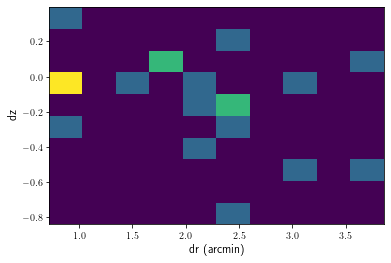

In [13]:
plt.xlabel('dr (arcmin)',fontsize=12)
plt.ylabel('dz',fontsize=12)
plt.hist2d(dr*60.,dz)
plt.savefig('dzdr.png')

In [167]:
len(dz)/len(src)

0.7692307692307693

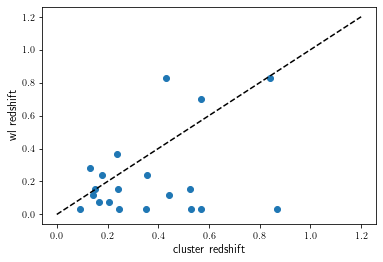

In [172]:
plt.scatter(zC[matches1['i1']],src[matches1['i2']]['z'])
plt.plot(np.linspace(0,1.2,10),np.linspace(0,1.2,10),c='black',ls='--')
plt.xlabel('cluster redshift',fontsize=12)
plt.ylabel('wl redshift',fontsize=12)
plt.savefig('redshift_bias.png')